In [23]:
#import libraries

# First let's import the packages we will use in this project
# You can do this all now or as you need them
import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

pd.options.mode.chained_assignment = None


# Reading the data

df = pd.read_csv(r'C:\Users\jagua\Downloads\movies.csv')

In [25]:
# Looking at the data

df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [27]:
#checking for missing data

for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, pct_missing))

name - 0.0%
rating - 0.010041731872717789%
genre - 0.0%
year - 0.0%
released - 0.0002608242044861763%
score - 0.0003912363067292645%
votes - 0.0003912363067292645%
director - 0.0%
writer - 0.0003912363067292645%
star - 0.00013041210224308815%
country - 0.0003912363067292645%
budget - 0.2831246739697444%
gross - 0.02464788732394366%
company - 0.002217005738132499%
runtime - 0.0005216484089723526%


In [29]:
df.dropna(inplace= True)

In [71]:
df.isnull().sum()

name        0
rating      0
genre       0
year        0
released    0
score       0
votes       0
director    0
writer      0
star        0
country     0
budget      0
gross       0
company     0
runtime     0
dtype: int64

In [35]:
df.dtypes

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object

In [37]:
# Change datatypes of columns

df['budget'] = df['budget'].astype('int64')
df['gross'] = df['gross'].astype('int64')

In [61]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0


In [69]:
df.isnull().sum()

name        0
rating      0
genre       0
year        0
released    0
score       0
votes       0
director    0
writer      0
star        0
country     0
budget      0
gross       0
company     0
runtime     0
dtype: int64

In [77]:
df.sort_values(by = ['gross'], inplace = False, ascending = False)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0
7480,The Lion King,PG,Animation,2019,"July 19, 2019 (United States)",6.9,222000.0,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000,1670727580,Walt Disney Pictures,118.0
6653,Jurassic World,PG-13,Action,2015,"June 12, 2015 (United States)",7.0,593000.0,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000,1670516444,Universal Pictures,124.0
6043,The Avengers,PG-13,Action,2012,"May 4, 2012 (United States)",8.0,1300000.0,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000,1518815515,Marvel Studios,143.0
6646,Furious 7,PG-13,Action,2015,"April 3, 2015 (United States)",7.1,370000.0,James Wan,Chris Morgan,Vin Diesel,United States,190000000,1515341399,Universal Pictures,137.0
7494,Frozen II,PG,Animation,2019,"November 22, 2019 (United States)",6.8,148000.0,Chris Buck,Jennifer Lee,Kristen Bell,United States,150000000,1450026933,Walt Disney Animation Studios,103.0


In [75]:
pd.set_option('display.max_rows', None)

In [83]:
#drop any duplicates

df['company'].drop_duplicates()

0                                            Warner Bros.
1                                       Columbia Pictures
2                                               Lucasfilm
3                                      Paramount Pictures
4                                          Orion Pictures
6                                      Universal Pictures
7                            Chartoff-Winkler Productions
8                                          Dovemead Films
9                                          United Artists
10                                    The Malpaso Company
11                                           C.A.T. Films
14                                      Filmways Pictures
15                                        Rastar Pictures
17                                              IPC Films
18                                  AVCO Embassy Pictures
20                             Lorimar Film Entertainment
21                                   Partisan Productions
22            

#Budget high correlation 
#Gross high correlation

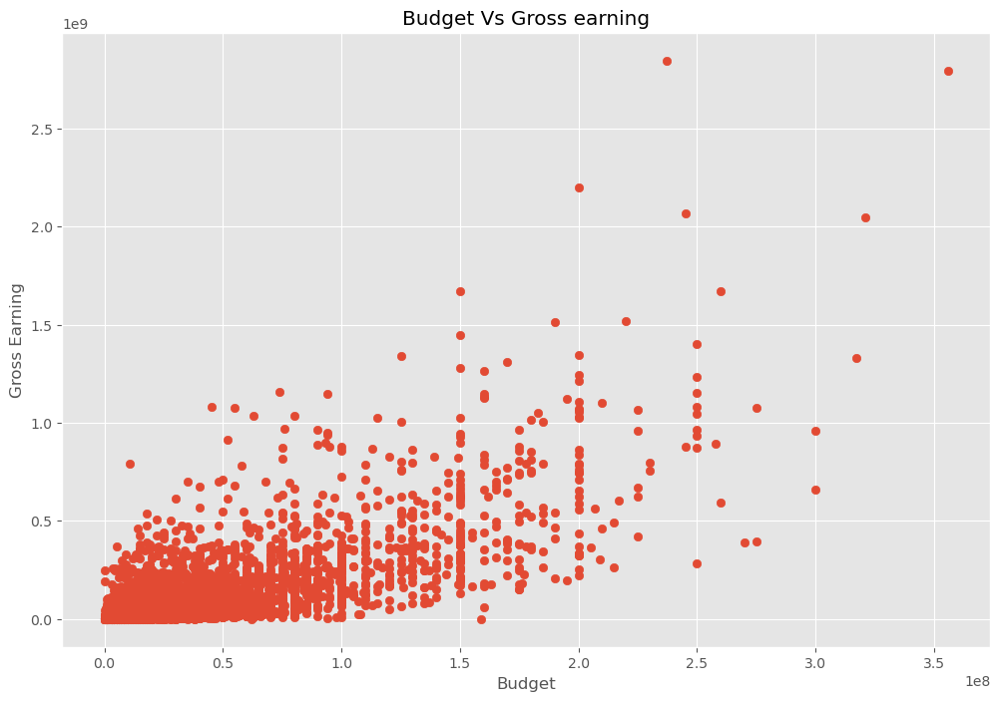

In [88]:
# Scatter plot with budget vs Gross

plt.scatter( x = df['budget'], y= df['gross'])

plt.title('Budget Vs Gross earning')
plt.xlabel('Budget')
plt.ylabel('Gross Earning')
plt.show()

<Axes: xlabel='budget', ylabel='gross'>

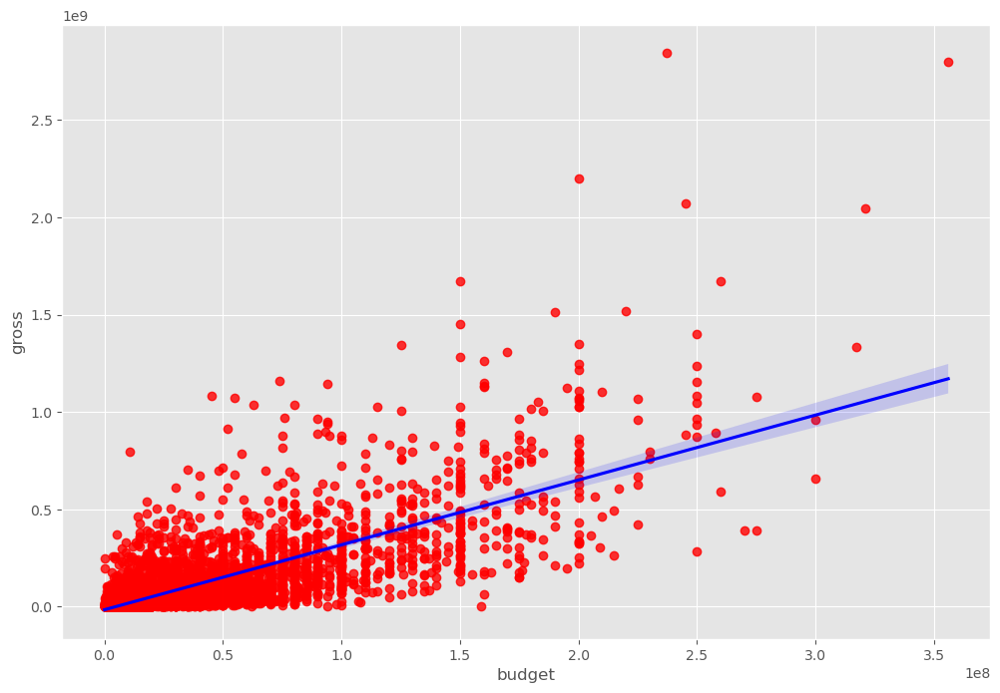

In [92]:
# plot the budget vs gross using seaborn

sns.regplot( x = 'budget', y = 'gross', data = df, scatter_kws={"color": "red"}, line_kws = {"color" : "blue"})

In [104]:
# checking for correlation

df.corr(numeric_only=True)

,year,score,votes,budget,gross,runtime
year,1.000000,0.056386,0.206021,0.327722,0.274321,0.075077
score,0.056386,1.000000,0.474256,0.072001,0.222556,0.414068
votes,0.206021,0.474256,1.000000,0.439675,0.614751,0.352303
budget,0.327722,0.072001,0.439675,1.000000,0.740247,0.318695
gross,0.274321,0.222556,0.614751,0.740247,1.000000,0.275796
runtime,0.075077,0.414068,0.352303,0.318695,0.275796,1.000000


In [ ]:
# Found High correlation with Budget

Text(0.5, 58.7222222222222, 'Movie features')

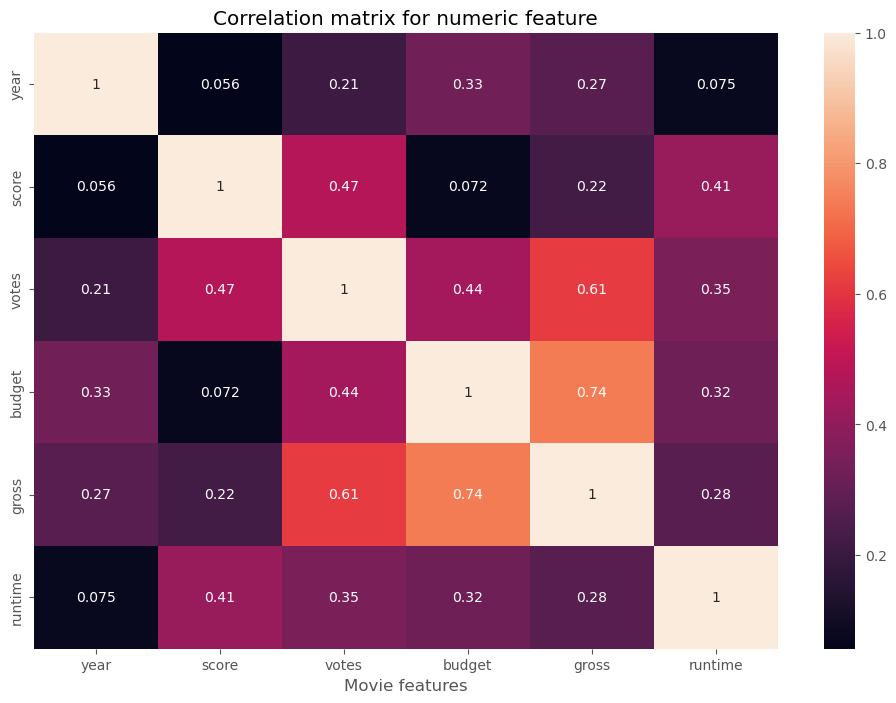

In [110]:
Correlation_matrix = df.corr(numeric_only=True)

sns.heatmap( Correlation_matrix, annot= True)

plt.title('Correlation matrix for numeric feature')

plt.xlabel('Movie features')


In [156]:
#company is not numeric

df_numeric = df.copy()

for col_name in df_numeric.columns:
    df_numeric[col_name] = df_numeric[col_name].astype('category').cat.codes
        
df_numeric

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,4692,6,6,0,1304,64,695,1795,2832,699,46,196,3021,1426,77
1,3929,6,1,0,1127,38,180,1578,1158,214,47,86,3304,452,35
2,3641,4,0,0,1359,67,708,757,1818,1157,47,192,5231,945,55
3,204,4,4,0,1127,57,335,889,1413,1474,47,75,3721,1108,19
4,732,6,4,0,1170,53,223,719,351,271,47,102,2803,1083,29
5,1509,6,9,0,1922,44,238,1758,3081,155,47,35,2801,1108,26
6,3930,6,0,0,1359,59,302,974,576,860,47,224,4088,1397,64
7,3122,6,3,0,530,62,438,1269,1257,1469,47,192,2193,390,60
8,3732,4,0,0,1346,48,216,1606,1402,595,47,273,4026,548,58
9,4401,6,3,0,1755,50,125,2011,280,402,47,137,1731,1391,31


Text(0.5, 58.7222222222222, 'Movie features')

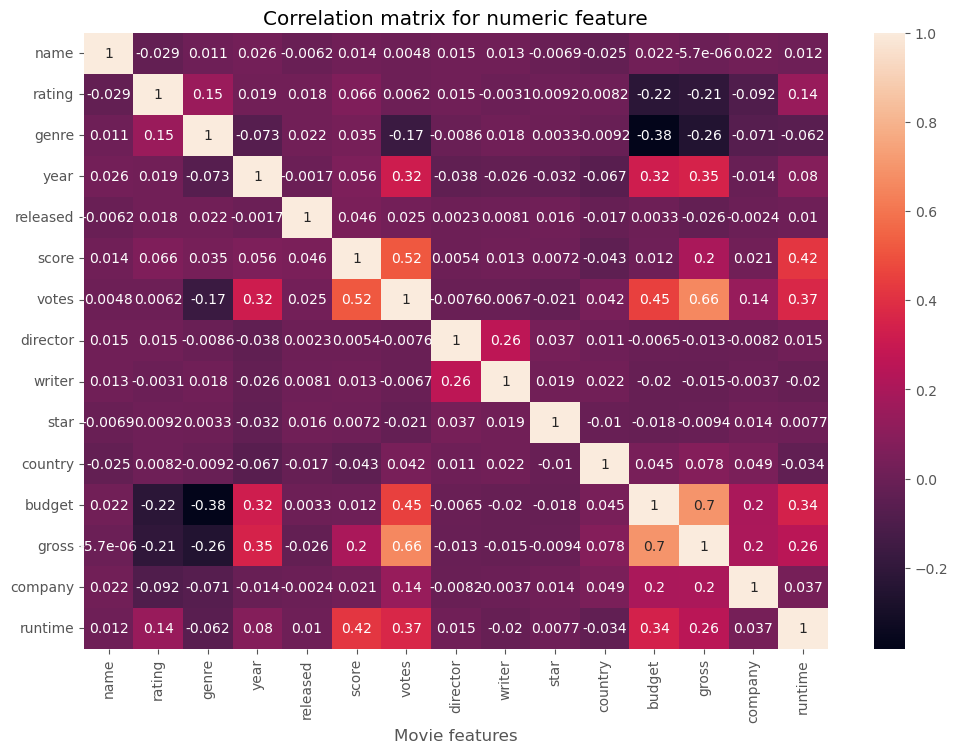

In [158]:
Correlation_matrixx = df_numeric.corr(method = 'pearson')

sns.heatmap( Correlation_matrixx, annot= True)

plt.title('Correlation matrix for numeric feature')

plt.xlabel('Movie features')

In [162]:
df_numeric.corr()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
name,1.000000,-0.029234,0.010996,0.025542,-0.006152,0.014398,0.004803,0.015246,0.012880,-0.006882,-0.025490,0.021723,-0.000006,0.021697,0.011963
rating,-0.029234,1.000000,0.147796,0.019499,0.018083,0.065945,0.006165,0.014656,-0.003149,0.009196,0.008230,-0.220313,-0.206712,-0.092357,0.144798
genre,0.010996,0.147796,1.000000,-0.073167,0.022142,0.035086,-0.169172,-0.008553,0.017578,0.003341,-0.009164,-0.381440,-0.255992,-0.071334,-0.061916
year,0.025542,0.019499,-0.073167,1.000000,-0.001740,0.056446,0.316304,-0.038354,-0.025908,-0.032157,-0.066748,0.323170,0.351284,-0.014333,0.079776
released,-0.006152,0.018083,0.022142,-0.001740,1.000000,0.045794,0.024880,0.002308,0.008072,0.015706,-0.017228,0.003289,-0.026190,-0.002407,0.010112
score,0.014398,0.065945,0.035086,0.056446,0.045794,1.000000,0.516431,0.005409,0.012810,0.007215,-0.043123,0.012156,0.196959,0.020676,0.418420
votes,0.004803,0.006165,-0.169172,0.316304,0.024880,0.516431,1.000000,-0.007571,-0.006695,-0.021070,0.041741,0.450646,0.657358,0.140184,0.366337
director,0.015246,0.014656,-0.008553,-0.038354,0.002308,0.005409,-0.007571,1.000000,0.261735,0.036593,0.011133,-0.006519,-0.013388,-0.008223,0.015214
writer,0.012880,-0.003149,0.017578,-0.025908,0.008072,0.012810,-0.006695,0.261735,1.000000,0.018520,0.022488,-0.019891,-0.014818,-0.003697,-0.019529
star,-0.006882,0.009196,0.003341,-0.032157,0.015706,0.007215,-0.021070,0.036593,0.018520,1.000000,-0.009990,-0.017798,-0.009351,0.014082,0.007701


In [164]:
corr_mat = df_numeric.corr()

corr_pairs = corr_mat.unstack()

corr_pairs

name      name        1.000000
          rating     -0.029234
          genre       0.010996
          year        0.025542
          released   -0.006152
          score       0.014398
          votes       0.004803
          director    0.015246
          writer      0.012880
          star       -0.006882
          country    -0.025490
          budget      0.021723
          gross      -0.000006
          company     0.021697
          runtime     0.011963
rating    name       -0.029234
          rating      1.000000
          genre       0.147796
          year        0.019499
          released    0.018083
          score       0.065945
          votes       0.006165
          director    0.014656
          writer     -0.003149
          star        0.009196
          country     0.008230
          budget     -0.220313
          gross      -0.206712
          company    -0.092357
          runtime     0.144798
genre     name        0.010996
          rating      0.147796
        

In [169]:
sorted_pairs = corr_pairs.sort_values()

sorted_pairs

genre     budget     -0.381440
budget    genre      -0.381440
genre     gross      -0.255992
gross     genre      -0.255992
budget    rating     -0.220313
rating    budget     -0.220313
gross     rating     -0.206712
rating    gross      -0.206712
genre     votes      -0.169172
votes     genre      -0.169172
company   rating     -0.092357
rating    company    -0.092357
year      genre      -0.073167
genre     year       -0.073167
          company    -0.071334
company   genre      -0.071334
country   year       -0.066748
year      country    -0.066748
runtime   genre      -0.061916
genre     runtime    -0.061916
country   score      -0.043123
score     country    -0.043123
year      director   -0.038354
director  year       -0.038354
runtime   country    -0.034457
country   runtime    -0.034457
star      year       -0.032157
year      star       -0.032157
rating    name       -0.029234
name      rating     -0.029234
gross     released   -0.026190
released  gross      -0.026190
year    

In [173]:
high_corr = sorted_pairs[sorted_pairs > 0.5]

high_corr

score     votes       0.516431
votes     score       0.516431
gross     votes       0.657358
votes     gross       0.657358
gross     budget      0.696077
budget    gross       0.696077
name      name        1.000000
director  director    1.000000
gross     gross       1.000000
budget    budget      1.000000
country   country     1.000000
star      star        1.000000
writer    writer      1.000000
votes     votes       1.000000
score     score       1.000000
released  released    1.000000
year      year        1.000000
genre     genre       1.000000
rating    rating      1.000000
company   company     1.000000
runtime   runtime     1.000000
dtype: float64

In [ ]:
# Found budget and gross are highly correlated
# Found votes and  gross are highly correlated